# Exploratory Data Analysis: Geographic Segmentation

### In this notebook I will continue to explore Caring Transitions of Southern Arizona Ctbids sales history data. I will take a further look at customer distrubtion by location and identify customer segments based on geographical and shipping behaviors. I will also be using Simplemaps database to link zip codes to lat/long.
Source: https://simplemaps.com/data/us-zips

#### **Potential Key Features for Geographic Segmentation:**
'Zip': Primary geographical identifier for customer segmentation

'IRM': Informs us if an item was shipped, or local by using pick-up or delivery

'Sales Price': Higher priced items can impact shipping, or locate which region spends the most

'Number of Bids': Can indicate demand which may influence shipping

'Number of Views': Can indicate interest but may not directly correlate with shipping

#### **Most Influential Features for Predicting Shipping Likelihood:**
'Zip': Categorical - Core geographic segmentation variable

'Sale Price': Numeric - Expensive items may have different shipping preferences

'Number of Bids': Numeric - Popular items might be more frequently shipped

'Invoice Status': Categorical - Determines if an item was purchased

'IRM': Categorical - Target variable (Shipping vs. Pickup/Delivery)

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from scipy.stats import chi2_contingency
from sklearn.cluster import KMeans, DBSCAN
from sklearn.preprocessing import StandardScaler
import us

In [6]:
# Loading in the data
df = pd.read_csv('wrangled_saleshist.csv', index_col=0)

In [7]:
df.head()

,Customer ID,Item Name,SKU,Category Name,Invoice Number,Invoice Status,IRM,Zip,Buyers Premium,Status,Sale Title,Sale Start Date,Sale End Date,Reserve Price,Number of Views,Sale Price,Tax,Number of Bids,Taxexempt,Item Link
0,1,2 Box Cloth And Fabric Mystery Lot #1,SBE4712T2,Mystery Lots,3002387119,Paid,pickup,85746,2.75,Sold,CTBIDS WH Online Auction | JULY VOL. 4 | Ends:...,2024-07-17 17:30:00-07:00,2024-07-22 18:30:00-07:00,0.0,68,15.27,1.33,9,True,https://ctbids.com/estate-sale/30023/item/3301432
1,2,"American Flag Tapestry, ESPN Football, Pop Wa...",DTE5014SW,Sports Memorabilia,315344089101,Paid,pickup,85713,0.00,Sold,CTBIDS WH Online Auction | SEPTEMBER VOL. 5 | ...,2024-09-25 17:30:00-07:00,2024-09-30 18:30:00-07:00,0.0,30,3.00,0.00,3,True,https://ctbids.com/estate-sale/31534/item/3501414
2,3,Ashley Dining Room Table,K1722,Tables,30105505340,Paid,pickup,85756,9.36,Sold,CTBIDS In-Home Online Auction I AUTUMN DUSK I ...,2024-07-18 18:30:00-07:00,2024-07-23 18:30:00-07:00,0.0,97,52.00,4.52,19,True,https://ctbids.com/estate-sale/30105/item/3301548
3,4,Beautiful wall art,LVW4606AC,Art Other,30173690011,Paid,pickup,85546,0.54,Sold,CTBIDS WH Online Auction | AUGUST VOL. 1 | End...,2024-07-24 17:30:00-07:00,2024-07-29 18:30:00-07:00,0.0,36,3.00,0.26,3,True,https://ctbids.com/estate-sale/30173/item/3317953
4,4,C Jaffey Original Oil Painting of Cottage Lan...,CCO4514AC5,Paintings,31215690005,Paid,pickup,85546,1.78,Sold,CTBIDS WH Online Auction | SEPTEMBER VOL. 3 | ...,2024-09-11 17:30:00-07:00,2024-09-16 18:30:00-07:00,0.0,25,9.88,0.86,10,True,https://ctbids.com/estate-sale/31215/item/3453069


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7976 entries, 0 to 8152
Data columns (total 20 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Customer ID      7976 non-null   int64  
 1   Item Name        7976 non-null   object 
 2   SKU              7976 non-null   object 
 3   Category Name    7976 non-null   object 
 4   Invoice Number   7976 non-null   int64  
 5   Invoice Status   7976 non-null   object 
 6   IRM              7976 non-null   object 
 7   Zip              7976 non-null   int64  
 8   Buyers Premium   7976 non-null   float64
 9   Status           7976 non-null   object 
 10  Sale Title       7976 non-null   object 
 11  Sale Start Date  7976 non-null   object 
 12  Sale End Date    7976 non-null   object 
 13  Reserve Price    7976 non-null   float64
 14  Number of Views  7976 non-null   int64  
 15  Sale Price       7976 non-null   float64
 16  Tax              7976 non-null   float64
 17  Number of Bids   79

**We need to adjust these dtypes**

**Dtypes:** 
- Category: depending on how many values we have in that field it likley makes sense to change that to a category 
- Invoice Number: does not contain decimals and would save space if this is converted into a int
- Invoice Status: is only two variables paid or unpaid so this would be best as a category 
- Item Receipt Method: can only be one of three options, best as a category
- Zip: US zip code which is only whole numbers best as int
- Status: either sold, not sold, or pending, best as category
- Sale Start Date: best as a datetime
- Sale End Date: best as a datetime
- Number of Bids: whole number, best as int
- Taxexempt: either yes or no, best as a bool

In [11]:
# Looking at 'Category Name' first
df['Category Name'].unique()

array(['Mystery Lots', 'Sports Memorabilia', 'Tables', 'Art Other',
       'Paintings', 'Collectibles Other', 'Chest Of Drawers',
       'Household Goods Other', 'Rings', 'Antiques Other',
       'Costume Jewelry', 'Clothing Other', 'Artful Pottery',
       'Figures & Figurines', 'Prints', 'Bedroom Goods', 'Hand Crafted',
       'Sculpture', 'Games & Toys', 'Asian Art', 'Native American Art',
       'Storage & Organization', 'Cabinets', 'Chairs', 'Fine Jewelry',
       'Hardback', 'Jewelry Other', 'Necklaces', 'Lawn & Landscape',
       'Vintage', 'Antique & Vintage', 'Kitchen & Home', 'Model Cars',
       'Furniture', 'Coins', 'Advertising', 'Sporting Goods Other',
       'Furniture Other', 'Comics', 'Sterling Silver', 'Cars', 'Storage',
       'Patio & Deck', 'Decor', 'China Sets', 'TVs', 'Records & CDs',
       'Patio Furniture', 'Home Video', 'Barware & Breweriana', 'Clocks',
       'Building Materials', 'Decorative Collectibles', 'Film', 'Office',
       'Magazines & Newspapers', 

In [12]:
# Even though there are a quite a bit listed it makes the most sense to convert to 'Category Name' to category
df['Category Name'] = df['Category Name'].astype('category')

In [13]:
# Adjusting additional columns dtypes
df['Invoice Number'] = df['Invoice Number'].astype('int')
df['Invoice Status'] = df['Invoice Status'].astype('category')
df['IRM'] = df['IRM'].astype('category')
df['Zip'] = df['Zip'].astype('category')
df['Status'] = df['Status'].astype('category')
df['Sale Start Date'] =  pd.to_datetime(df['Sale Start Date'], format='%m/%d/%Y %I:%M %p %Z', errors='coerce')
df['Sale End Date'] = pd.to_datetime(df['Sale End Date'], format='%m/%d/%Y %I:%M %p %Z', errors='coerce')
df['Number of Bids'] = df['Number of Bids'].astype('int')
df['Taxexempt'] = df['Taxexempt'].astype('bool')

In [14]:
df.dtypes

Customer ID                 int64
Item Name                  object
SKU                        object
Category Name            category
Invoice Number              int64
Invoice Status           category
IRM                      category
Zip                      category
Buyers Premium            float64
Status                   category
Sale Title                 object
Sale Start Date    datetime64[ns]
Sale End Date      datetime64[ns]
Reserve Price             float64
Number of Views             int64
Sale Price                float64
Tax                       float64
Number of Bids              int64
Taxexempt                    bool
Item Link                  object
dtype: object

**Now that the dtypes are corrected I am going to start by looking into our numeric and categorical variables.**

#### Numeric Features:  'Sale Price', 'Buyers Premium', 'Reserve Price', 'Number of Views', 'Tax', 'Number of Bids'

**Note:** Invoice Number, although we kept it as an int - for our purposes it is more relative to being a category since these are unique numbers assigned to each sale transaction by customer. Since this is not something that is relative to what we are looking into I am keeping it as an int but it will not be included as a Numeric Feature.

### Pearson Correlation Heatmap

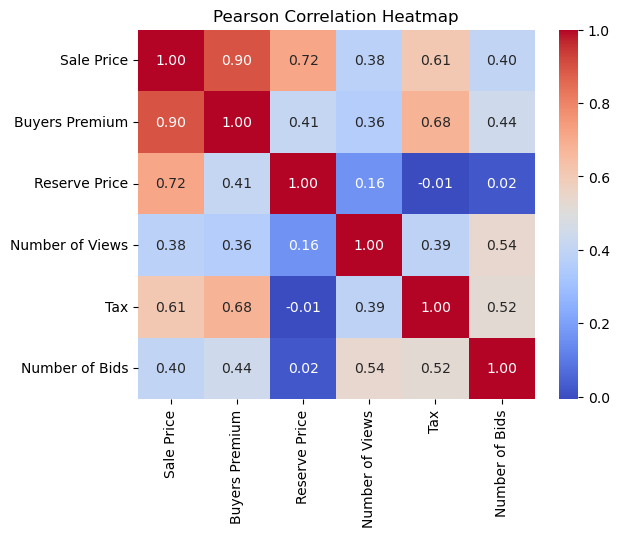

In [19]:
# Isolating numeric features
num_features = ['Sale Price', 'Buyers Premium', 'Reserve Price','Number of Views','Tax','Number of Bids']

# Compute Pearson correlation
corr_matrix = df[num_features].corr()

# Plot heatmap
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Pearson Correlation Heatmap")
plt.show()

Most of the numeric features that correlate are obvious such as tax and sale price or sale price and buyers premium as they all relate to one another. Number of Views and Number of Bids do show a positive correlation. We will visulaize that relationship next.

### Exploring Sale Price, Number of Bids, and Number of Views

**To better understand bidding behavior**
- Sale Price vs. Number of Bids - Do more bids drive a higher sales price?
- Sale Price vs. Number of Views - Do views impact sales price?
- Number of Bids vs. Number of Views - Does higher visibilty lead to more bids?

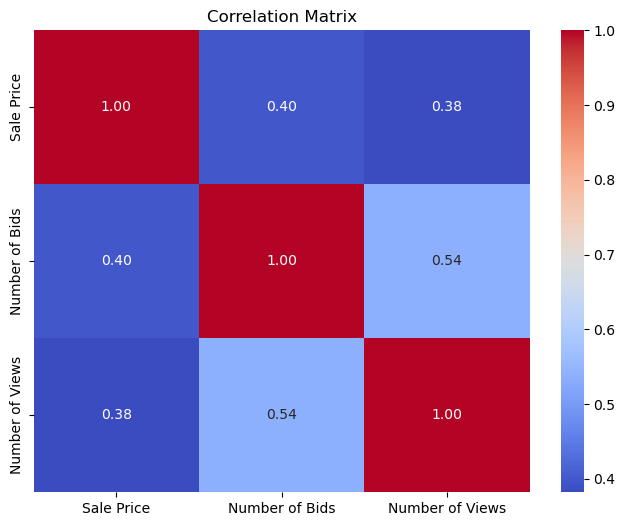

In [23]:
# Correlation between Sale Price, Bids, and Views
plt.figure(figsize=(8,6))
sns.heatmap(df[["Sale Price", "Number of Bids", "Number of Views"]].corr(), annot=True, cmap="coolwarm", fmt=".2f")

plt.title("Correlation Matrix")
plt.show()

**It looks like Number of Bids and Number of Views seem to have a high correlation**

#### Number of Bids vs. Number of Views

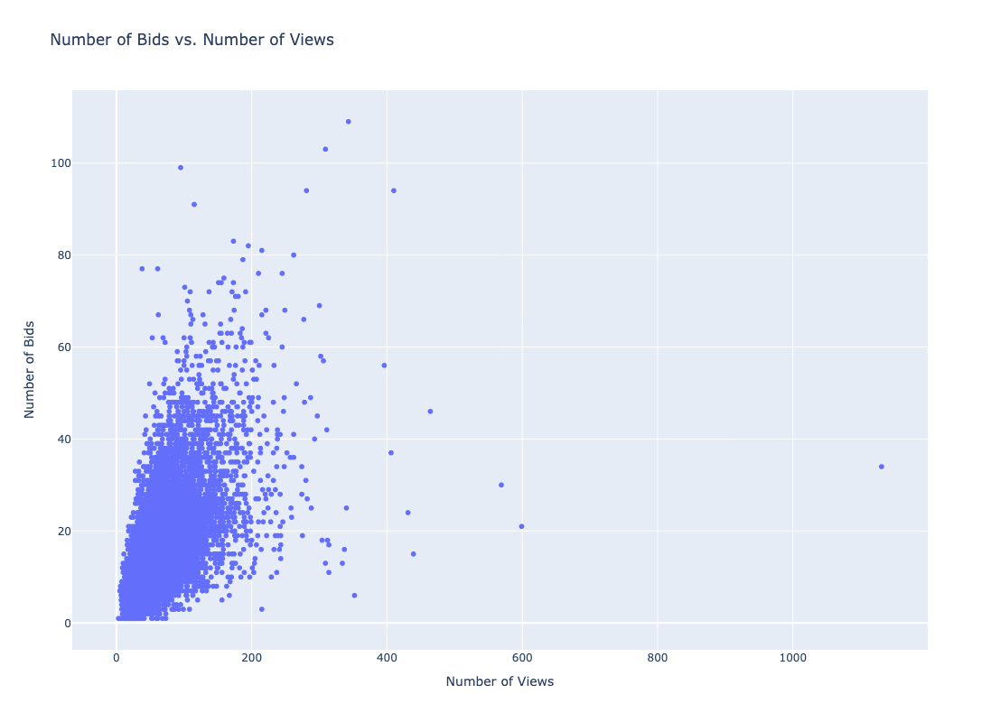

In [26]:
# Visualizing using plotly scatterplot
fig = px.scatter(df, x='Number of Views', y='Number of Bids', title='Number of Bids vs. Number of Views')
fig.update_layout(width=1000, height=800)
fig.show()

**There is an overall psitive relation between number of views and number of bids. The dense cluister of points shows that there is a common pattern among most listings wuth around 50-100 views and 10-30 bids. There are a few outlier, some items recieved over 400 views but did not necesaroily have proportionally high bids. There are also a few outliers with over 100 bids. Overall, not all highly viewed items receive many bids, suggesting that views don’t always translate into bidding activity.**

#### Sale Price & Number of Views

In [29]:
# Creating average sales price by 'Number of Views'
avg_sp = df.groupby('Number of Views', as_index=False)['Sale Price'].mean()
# Rounding average sales price
avg_sp['Sale Price'] = avg_sp['Sale Price'].round(2)

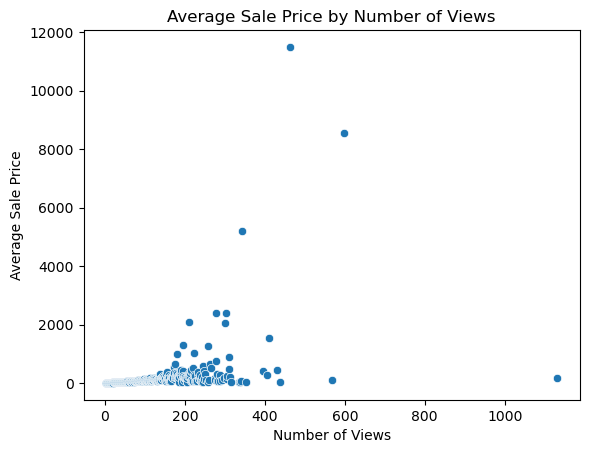

In [30]:
# Visualizing the relationship between 'Sales Price' & 'Number of Views'
sns.scatterplot(data=avg_sp, x='Number of Views', y='Sale Price')
plt.title("Average Sale Price by Number of Views")
plt.xlabel("Number of Views")
plt.ylabel("Average Sale Price")
plt.show()

**There seems to be a slight upward trend where an increase of views generally correlated to average sales price although the spread is quite large. There are some obvious outliers, the items with over 400 views seem to have extreme sales prices which is to be expected as sometimes there are luxury items such as cars or jewelry for sale but definitely something to look further into. Otherwise, most of the sale prices are concentrated below $200 and under 300 views suggesting the majority of items do not receive high engagement.**

#### Sale Price & Number of Bids

**Let's look at how sales price changes with number of bids**

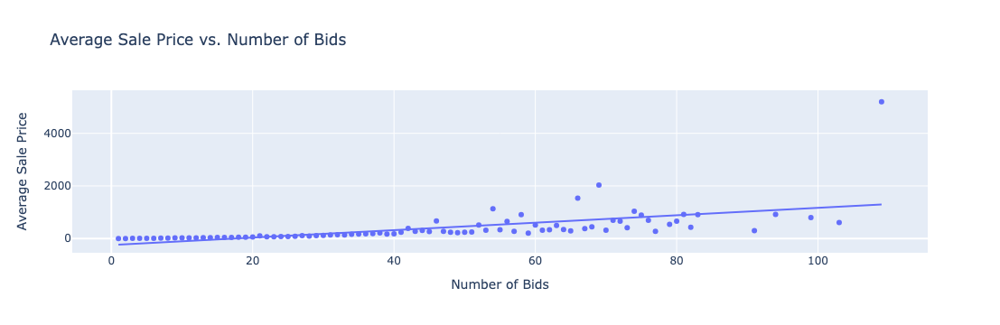

In [34]:
# Creating average sales price by 'Number of Bids'
avg_price_by_bids = df.groupby('Number of Bids', as_index=False)['Sale Price'].mean()

# Visualizing using plotly
fig = px.scatter(avg_price_by_bids, 
                 x='Number of Bids', 
                 y='Sale Price', 
                 title="Average Sale Price vs. Number of Bids",
                 labels={"Sale Price": "Average Sale Price", "Number of Bids": "Number of Bids"},
                 trendline="ols")
fig.show()

#### Sale Price Outliers

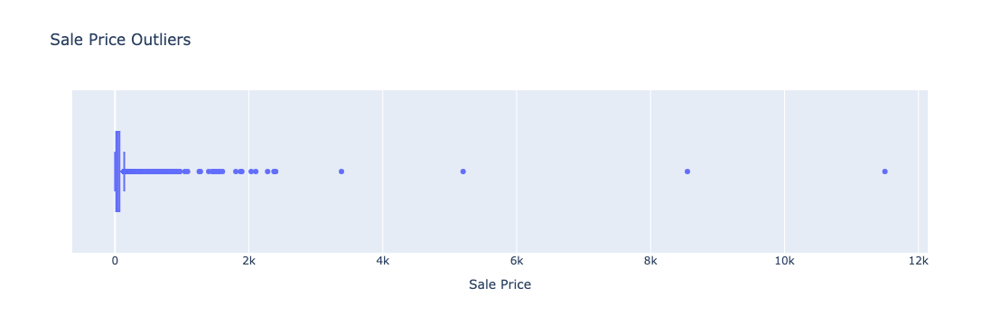

In [36]:
# Visualizing 'Sale Price' outliers using plotly
fig = px.box(df, x='Sale Price', title='Sale Price Outliers')
fig.show()

**Okay so we have 4 distint outliers, lets see what category they are**

#### Sale Price Outliers By Category

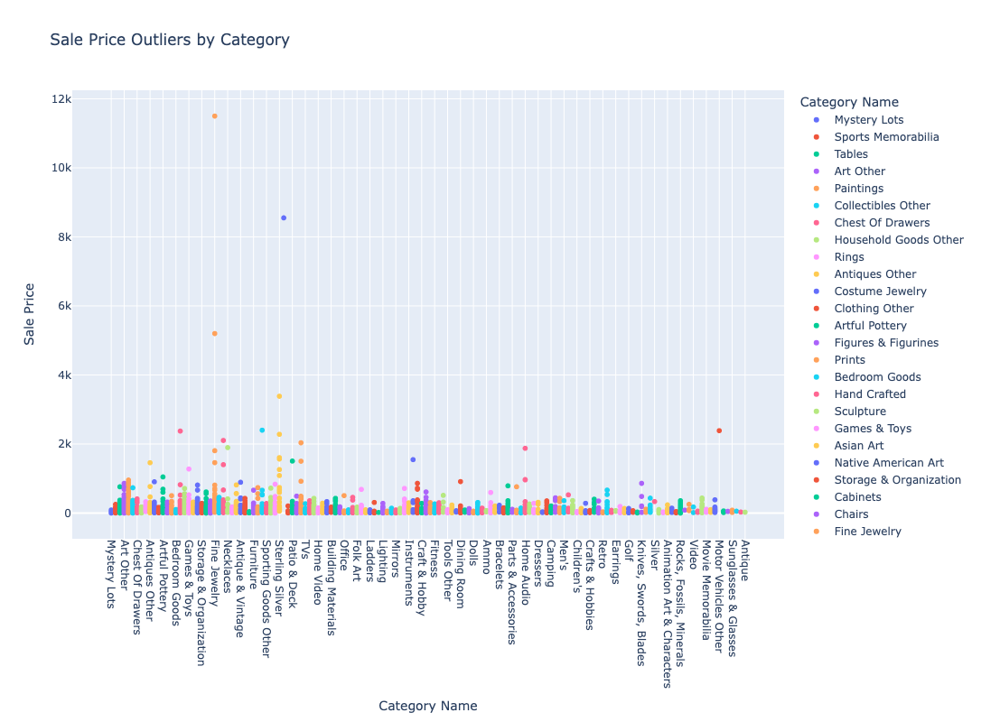

In [39]:
# Scatterplot using plotly
fig = px.scatter(df, x="Category Name", y="Sale Price", color="Category Name",
                 title="Sale Price Outliers by Category", hover_data=["Item Name"])
fig.update_xaxes(tickangle=90)
fig.update_layout(width=1000, height=800)
fig.show()

**As suspected, 3/4 of the outliers are fine jewelry sales, and the other a car.**

#### Lowest Average Sales Price by Category

/var/folders/r0/3ty1gxbn02q24zg2crgysbm40000gn/T/ipykernel_8268/1962579630.py:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



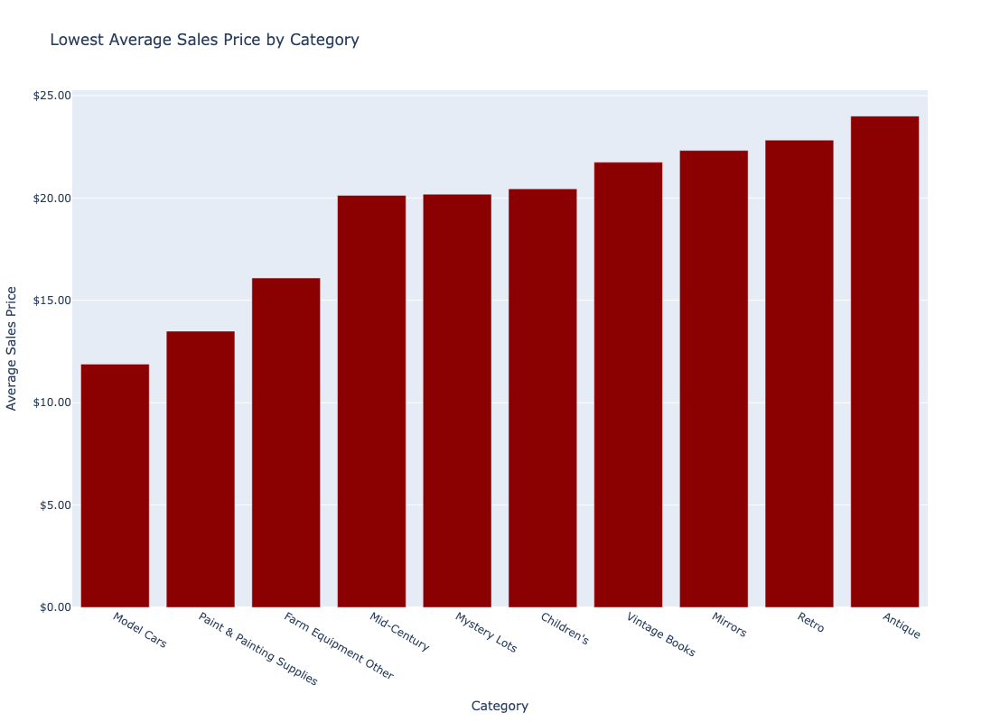

In [42]:
# Creating average 'Sales Price' by 'Category'
low_avg_price = df.groupby("Category Name")["Sale Price"].mean().sort_values().head(10)

# Visualizing using plotly
fig = px.bar(df, x=low_avg_price.index, y=low_avg_price.values, title='Lowest Average Sales Price by Category')
fig.update_layout(xaxis_title="Category", yaxis_title="Average Sales Price")
fig.update_layout(yaxis_tickprefix = '$', yaxis_tickformat = ',.2f')
fig.update_traces(marker_color='darkred')
fig.update_layout(width=1000, height=800)
fig.show()

#### Categorical Features: 'Zip', 'Invoice Status', 'IRM', 'Status', 'Category Name'

Since location (Zip), Invoice Status, and Shipping Method are categorical, we can use Chi-Square tests to analyze their relationships.

In [45]:
# Create a contingency table for Zip Code vs. Shipping Method
contingency_table = pd.crosstab(df['Zip'], df['IRM'])

# Perform chi-square test
chi2, p, dof, expected = chi2_contingency(contingency_table)

print(f"Chi-Square Statistic: {chi2}")
print(f"P-value: {p}")

Chi-Square Statistic: 8487.927920094868
P-value: 0.0


**We can conclude that there is a statistically significant relationship between 'Zip' and 'IRM'. The method tby which items are recieved (IRM) appears to vary depending on the zip code.**

## Analyzing Geographical Distribution

The most critical feature for segmentation is Zip, I am going to investigate how customer locations are distributed and their purchase behavior.

#### Distribution of Zip Codes

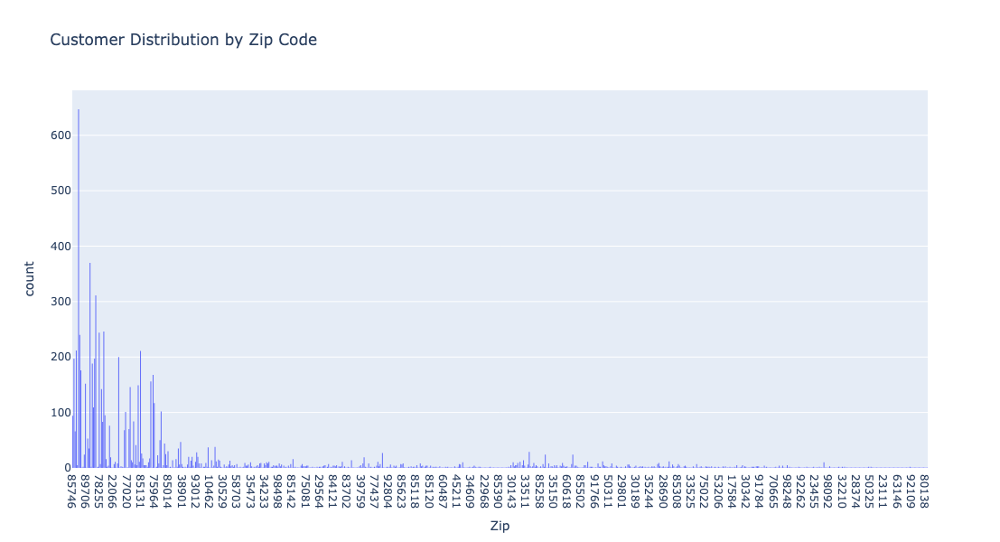

In [50]:
# Visualizing using plotly
fig = px.histogram(df, x='Zip', title="Customer Distribution by Zip Code")
fig.update_xaxes(type='category')
fig.update_layout(width=800, height=600)
fig.show()

**We know that all our zip codes are valid as we cleaned them back in the data wrangling step. Intrestingly the highest counts by zip code are all 857 numbers indicating the that it is in the general Tucson area which is the storefronts location. This is important for marketing needs.**

#### Average Sales Price by Zip

/var/folders/r0/3ty1gxbn02q24zg2crgysbm40000gn/T/ipykernel_8268/4104310878.py:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



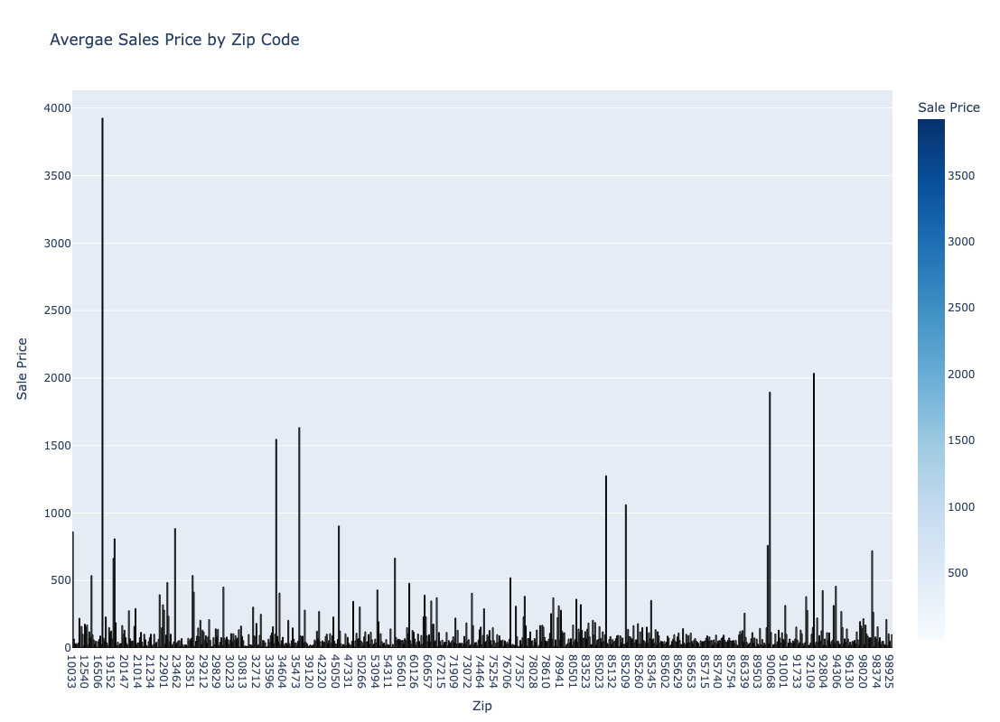

In [53]:
# Creating average sales price 
avg_price_by_zip = df.groupby('Zip').agg({'Sale Price': 'mean'}).reset_index()
# Rounding average sales price
avg_price_by_zip['Sale Price'] = avg_price_by_zip['Sale Price'].round(2)

# Visualizing using plotly
fig = px.bar(avg_price_by_zip,
             x='Zip',
             y='Sale Price',
             color='Sale Price',
             color_continuous_scale='Blues',
             title='Avergae Sales Price by Zip Code')
fig.update_xaxes(type='category')
fig.update_traces(marker=dict(line=dict(width=1, color='Black')))
fig.update_layout(width=1000, height=800)
fig.show()

**This is super insightful, knowing that the average highest sales price is happening in zip code 17112 (Harrisburg, Pennsylvania) and not where the majority of their customers are located. This is also important information for the marketing team to better understand their customer demographic.**

### Customer Segments Using Zip

Aggregate data by ZIP code to identify patterns in sales, customer behavior, and shipping likelihood.

In [57]:
# Loading in dataset that maps Zip codes to lat/long and cities/state
zip_data = pd.read_csv('uszips.csv')

In [58]:
zip_data.head()

,zip,lat,lng,city,state_id,state_name,zcta,parent_zcta,population,density,county_fips,county_name,county_weights,county_names_all,county_fips_all,imprecise,military,timezone
0,601,18.18027,-66.75266,Adjuntas,PR,Puerto Rico,True,NaN,16721.0,100.2,72001,Adjuntas,"{""72001"": 98.74, ""72141"": 1.26}",Adjuntas|Utuado,72001|72141,False,False,America/Puerto_Rico
1,602,18.36075,-67.17541,Aguada,PR,Puerto Rico,True,NaN,37510.0,477.6,72003,Aguada,"{""72003"": 100}",Aguada,72003,False,False,America/Puerto_Rico
2,603,18.45744,-67.12225,Aguadilla,PR,Puerto Rico,True,NaN,48317.0,543.1,72005,Aguadilla,"{""72005"": 99.76, ""72099"": 0.24}",Aguadilla|Moca,72005|72099,False,False,America/Puerto_Rico
3,606,18.16585,-66.93716,Maricao,PR,Puerto Rico,True,NaN,5435.0,47.3,72093,Maricao,"{""72093"": 82.27, ""72153"": 11.66, ""72121"": 6.06}",Maricao|Yauco|Sabana Grande,72093|72153|72121,False,False,America/Puerto_Rico
4,610,18.29110,-67.12243,Anasco,PR,Puerto Rico,True,NaN,25413.0,264.4,72011,Añasco,"{""72011"": 96.71, ""72099"": 2.82, ""72083"": 0.37,...",Añasco|Moca|Las Marías|Aguada,72011|72099|72083|72003,False,False,America/Puerto_Rico


In [59]:
#  Converting to string for a proper join
df['Zip'] = df['Zip'].astype(str)
zip_data['zip'] = zip_data['zip'].astype(str)

# Select relevant columns from the external dataset
zip_data_subset = zip_data[['zip', 'city', 'state_name', 'lat', 'lng']]

# Merging with sales history df
df = df.merge(zip_data_subset, left_on='Zip', right_on='zip', how='left')

# Drop redundant column
df.drop(columns=['zip'], inplace=True)

df.head()

,Customer ID,Item Name,SKU,Category Name,Invoice Number,Invoice Status,IRM,Zip,Buyers Premium,Status,...,Number of Views,Sale Price,Tax,Number of Bids,Taxexempt,Item Link,city,state_name,lat,lng
0,1,2 Box Cloth And Fabric Mystery Lot #1,SBE4712T2,Mystery Lots,3002387119,Paid,pickup,85746,2.75,Sold,...,68,15.27,1.33,9,True,https://ctbids.com/estate-sale/30023/item/3301432,Tucson,Arizona,32.06964,-111.09047
1,2,"American Flag Tapestry, ESPN Football, Pop Wa...",DTE5014SW,Sports Memorabilia,315344089101,Paid,pickup,85713,0.00,Sold,...,30,3.00,0.00,3,True,https://ctbids.com/estate-sale/31534/item/3501414,Tucson,Arizona,32.19525,-111.01510
2,3,Ashley Dining Room Table,K1722,Tables,30105505340,Paid,pickup,85756,9.36,Sold,...,97,52.00,4.52,19,True,https://ctbids.com/estate-sale/30105/item/3301548,Tucson,Arizona,32.07034,-110.90625
3,4,Beautiful wall art,LVW4606AC,Art Other,30173690011,Paid,pickup,85546,0.54,Sold,...,36,3.00,0.26,3,True,https://ctbids.com/estate-sale/30173/item/3317953,Safford,Arizona,32.71743,-109.58175
4,4,C Jaffey Original Oil Painting of Cottage Lan...,CCO4514AC5,Paintings,31215690005,Paid,pickup,85546,1.78,Sold,...,25,9.88,0.86,10,True,https://ctbids.com/estate-sale/31215/item/3453069,Safford,Arizona,32.71743,-109.58175


### Customer Segments: Finding Top Performing States by Sales Volume

In [61]:
state_sales = df.groupby('state_name').agg({'Sale Price': 'sum', 'Customer ID': 'count'}).reset_index()
state_sales.rename(columns={'Sale Price': 'Total Sales', 'Customer ID': 'Total Customers'}, inplace=True)

# Sort by sales
state_sales = state_sales.sort_values(by='Total Sales', ascending=False)

# Display the top states
print(state_sales.head(10))

      state_name  Total Sales  Total Customers
1        Arizona    387299.98             6241
3     California     27287.50              238
36         Texas     19935.61              210
32  Pennsylvania     19082.02               62
4       Colorado     11726.03               72
7        Florida      8230.80               87
38      Virginia      7852.22               53
21      Missouri      7580.17               28
8        Georgia      6435.58               76
39    Washington      5401.12               47


In [62]:
invalid_states = state_sales[~state_sales['state_name'].isin([state.name for state in us.states.STATES])]
print("Unrecognized State Names:", invalid_states['state_name'].unique())

Unrecognized State Names: ['District of Columbia']


In [63]:
state_sales['state_name'] = state_sales['state_name'].replace({'District of Columbia': 'Washington, D.C.'})

# Convert full state names to abbreviations safely
state_sales['state_abbr'] = state_sales['state_name'].map(lambda x: us.states.lookup(x).abbr if us.states.lookup(x) else None)

# Manually fix 'DC'
state_sales['state_abbr'] = state_sales['state_abbr'].fillna(state_sales['state_name'].map({'Washington, D.C.': 'DC'}))

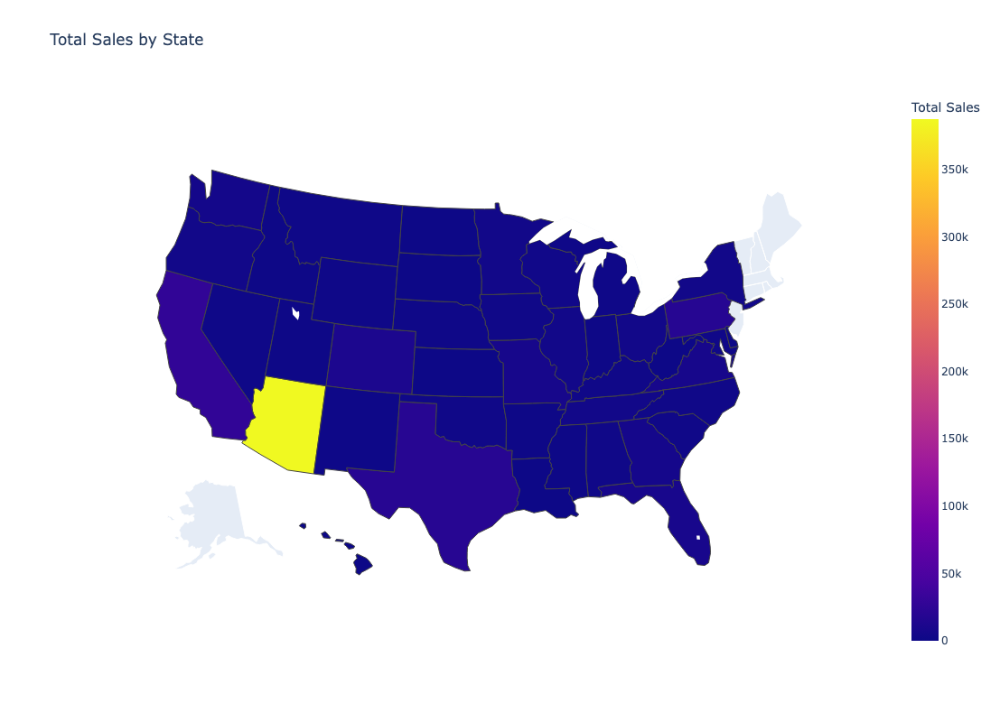

In [64]:
# Format 'Total Sales' as currency with two decimal places
state_sales['Total Sales Formatted'] = state_sales['Total Sales'].map(lambda x: f"${x:,.2f}")

# Visualizing using plotly 
fig = px.choropleth(state_sales, 
                    locations='state_abbr',
                    locationmode='USA-states', 
                    color='Total Sales', 
                    scope='usa', 
                    title="Total Sales by State",
                   hover_data={'state_abbr': True, 'Total Sales Formatted': True})

fig.update_layout(width=1000, height=800)
fig.show()

**Arizona is this storefronts top performing state**

### K-Means Clustering on Geolocation

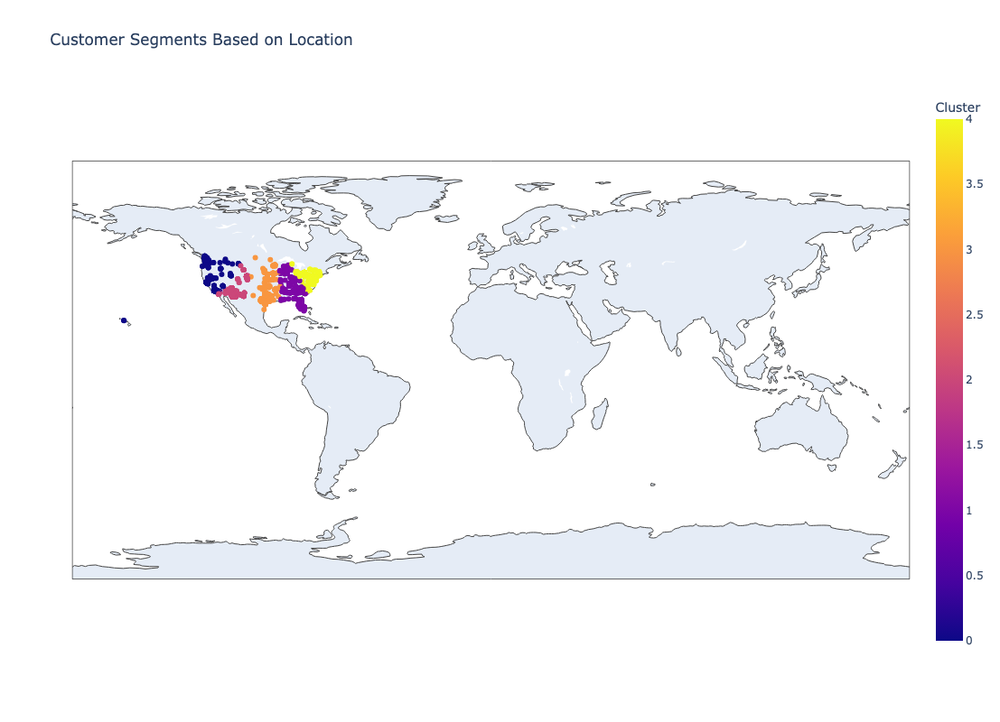

In [67]:
# Selecting relevant features
geo_data = df[['lat', 'lng']].dropna()  # Drop missing values

# Apply K-Means clustering
kmeans = KMeans(n_clusters=5, random_state=42)  # Adjust clusters as needed
geo_data['Cluster'] = kmeans.fit_predict(geo_data)

# Merge clusters back to the dataset
df.loc[geo_data.index, 'Cluster'] = geo_data['Cluster']

# Visualize clusters on a scatter plot
fig = px.scatter_geo(df, 
                     lat='lat', lon='lng', 
                     color='Cluster', 
                     hover_data=['city', 'state_name'],
                     title="Customer Segments Based on Location")
fig.update_layout(width=1000, height=800)
fig.show()

**Cluster Analysis & Description**
Cluster 0: High-density urban areas (e.g., large metropolitan cities).

Cluster 1: Medium-density suburban regions with significant customer presence.

Cluster 2: Low-density rural areas, where sales volume may be lower.

Cluster -1: Noise points (outliers that do not belong to any cluster).

### Clustering Based on DBSCAN (Density-Based Spatial Clustering of Applications with Noise)

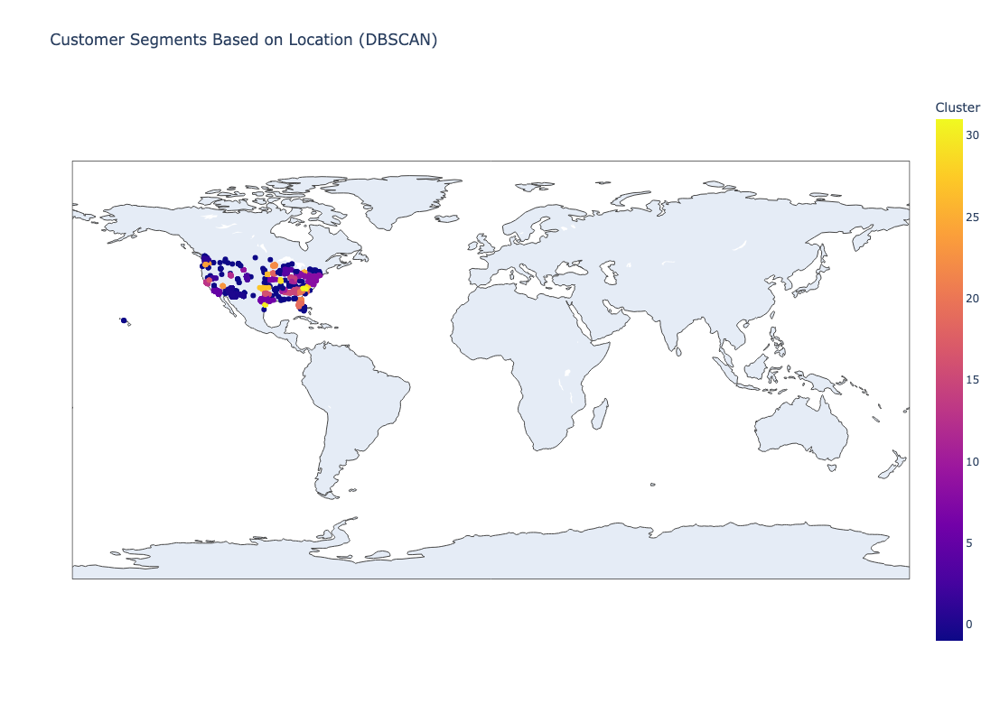

In [70]:
# Selecting relevant features (latitude & longitude)
geo_data = df[['lat', 'lng']].dropna()

# Normalize the data for better clustering performance
scaler = StandardScaler()
geo_scaled = scaler.fit_transform(geo_data)

# Apply DBSCAN clustering (adjust eps & min_samples for optimal results)
dbscan = DBSCAN(eps=0.2, min_samples=10)  # eps controls neighborhood size
geo_data['Cluster'] = dbscan.fit_predict(geo_scaled)

# Merge clusters back to the dataset
df.loc[geo_data.index, 'Cluster'] = geo_data['Cluster']

# Visualize clusters on a scatter plot
fig = px.scatter_geo(df, 
                     lat='lat', lon='lng', 
                     color='Cluster', 
                     hover_data=['city', 'state_name'],
                     title="Customer Segments Based on Location (DBSCAN)")
fig.update_layout(width=1000, height=800)
fig.show()

**Cluster Description for DBSCAN**

0- Largest, most densely packed regions (likely major urban hubs)

5- High customer density areas, but slightly less than cluster 0

10- Mid-tier suburban areas with a good number of transactions

15- Less dense, possibly smaller towns with moderate sales

20- Low-density areas, potentially rural but with some business activity

25- Sparse clusters with few active buyers, likely semi-rural zones

30- Very low-density locations, bordering on outliers

## Summary

Original Data was having 8152 Observations and 26 variables (Output from Data Wrangling Part).
There was modifications in the dataframe which focused mainly on changing the dtypes to work with them more easily and incorporate in additional dataset that mapped zip codes to city/state/latitude and longitude:
Missing Values (NANs): Null values where handled in the data wrangling step
**Insignificant Columns:** Should I drop the columns not used- 'SKU', 'Invoice Number', 'Sale Title', 'Sale Start Date', 'Sale End Date', 'Tax Exempt', 'Item Link'
Duplicates: There where no duplicates in this df
Divided the variables into 2 categories: Numerical and categorical as below:
Numerical Variables:  'Sale Price', 'Buyers Premium', 'Reserve Price', 'Number of Views', 'Tax', 'Number of Bids'
Categorical Variables: 'Zip', 'Invoice Status', 'IRM', 'Status', 'Category Name'

Pearson Correlation Matix was used to visualize Numerical Features and a combination of scatterplot, boxplot and correlation matrix
Chi-Square Statistic, along with scatterplots and bar plots where used to visualize the relationships between the Categorical features.

Main target of this section was to further analyze customers distrubtion by location and identify customer segments based on geographical and shipping behaviors. Shipping behaviors will be further focused during the pre-processing step.